In [24]:
from IPython.display import HTML
HTML('''
<script src="https://cdnjs.cloudflare.com/ajax/libs/jquery/2.0.3/jquery.min.js "></script>
<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.jp-CodeCell > div.jp-Cell-inputWrapper').hide();
 } else {
$('div.jp-CodeCell > div.jp-Cell-inputWrapper').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
<form action="javascript:code_toggle()"><input type="submit" value="Click here to toggle on/off the raw code."></form>
''')

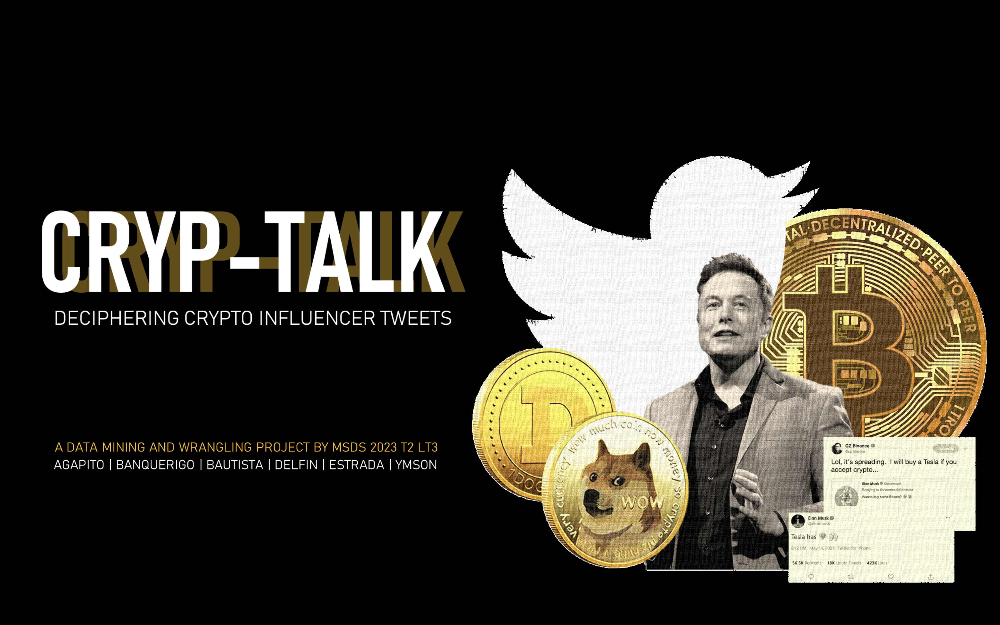

## Executive Summary

The project aims to understand the sentiment of Twitter Crypto Influencers/Traders using their tweets extracted using the Twitter API V2. We will specifically look into how their tweets differ between the Bull (Oct 1 – Nov 30, 2021) and Bear market (Oct 1 – Nov 26, 2022). Originally, the team extracted data from the Top 100 Crypto Influencers, however, results show that bull and bear markets are not that differentiable since a lot of the influencertweets also include non-crypto tweets. The team have further researched and found a list of Crypto Influencers that are focused on trading, and based on initial testing, the clusters became more interpretable.

The data was extracted from Twitter using Twitter API. The group was able to secure an Academic Access that allowed us to extract the data that the group needed for the study.

The `text` column, which contains the body of the tweets, was processed in order to remove stop words, numbers and special characters. URL's and emails were also removed since the group believes that they will not offer much insight. The tweets were also lemmatized using the [NLTK library](https://www.nltk.org/index.html), meaning words like "drink", "drinks", "drank", "drunk" and "drinking" are treated as the same word.

Exploratory data analysis was performed to understand how we can utilize the data further in our business case. The EDA primarily focuses on contextualizing the tweets to support the succeeding algorithms we performed.

The tweets were vectorized by converting it to a bag-of-words representation with term frequency-inverse document frequency (TF-IDF) weights. The rationale behind the weights is to put less emphasis on commonly occurring words in the corpus so that the variety of topics can be easily surfaced. Because of the expected large number of tokens after tokenization, the number of dimensions of the vectorized data was reduced using latent semantic analysis. The group retained the number of components that would lead to 90% cumulative variance explained.

The result of the dimensionality reduction was fed to a clustering algorithm. The group chose the K-Means clustering method for two reasons: (1) it is the most interpretable out of all clustering methods, and (2) hierarchical clustering is not ideal for very large data sets. The ideal number of clusters was identified by computing the inertia and silhouette scores. Finally, we generated insights by interpreting the clustering results.

Based on the output from we can see that there’s a dominant topic in every cycle and this is true even with the older data set that we used through the words we have focused on with actual Crypto Influencer Traders provided more interpretability. From our presentation the bull market shows positive sentiment with 82.1% of tweets clustered to it and the rest are related to Technical Analysis, Influencer Engagements, Breaking the All-Time High and pushing people to invest in the bull run. While the Bear market did not push completely on the negative side of the market, influencers focused on the discussions with each other at 77.5% sharing opinions and trying to keep positive. There are still discussions on how bad the market is, technical analysis, and recent issues like the FTX crash. Note that interpretation of results may vary per individual and how deep their crypto knowledge is. 

We have also attached the original file we used for reference of our analysis we have identified that the random state of the clustering may change the results but the topics are still the same though its % on how it relates with each cluster moved around.

This study can be beneficial for new crypto traders who want to get into the market to see how the opinion of traders shapes narratives communicated to the audiences. They can also look into them individually and weigh which ones deem credible based on their topics. For further studies, the team wants to compare all the bear and bull runs so a baseline can be set and to use temporal analysis to study the changes in the behavior of the tweets.

## Data Description

The text data was extracted from Twitter using Twitter API. The specific users whose tweets were scraped came from [this website](https://invezz.com/news/2021/02/09/top-crypto-traders-on-twitter/) of the top 50 crypto traders. Only the top 20 traders were included in the interest of lower computational times, but the algorithms used in the project can be easily applied to the full dataset. We retrieved 24,723 tweets from October 1 to November 30, 2021 which was part of bull run, and about 15,270 tweets from October 1, 2022 to November 26, 2022 which is part of the current bear run.

Originally, the group analyzed a different list of users which included the likes of Elon Musk and Gary Gensler (chair of US Securities and Exchange Commission). The tweets from these personalities noticeably affected the value of crypto, but they also tweet about non-crypto-related topics. The results from that data were barely interpretable; there were too many topics being discussed for the group to be able to identify coherent themes. The influencers on the current list exclusively talk about crypto.

## Data Assumptions and Limitation

The data only encompasses a limited number of crypto influencers. These influencers were chosen because of their high follower count, influence in the crypto community, and focus on technical analysis. The evaluation of the influencers is subject to the opinions of the authors of this project. The data was also contrained to specific months of 2021 and 2022 only. Hence the results may not completely capture the themes of bull runs and bear runs that happened in other years.

## Introduction

### Background
Cryptocurrency is one of the biggest revolutions of the 21st century. It is a form of digitalized currency that takes advantage of cryptography, computer algorithms, and the newly established blockchain technology. Its main attractions are that it is digital, cheaper to transact with, and that it is decentralized.

Being digital, it becomes more convenient to use to transfer wealth overseas. With it being able to bypass traditional banking processes. Cryptocurrency saw value in being able to transfer substantial amounts of wealth cheaper and faster than banks. Additionally, it being decentralized, means that the transactions can be done anonymously and more securely since the ledger of transactions is equally stored on every node of the cryptocurrency blockchain.

Blockchain technology is the backbone of cryptocurrency. Without it, the system does not work. Blockchain technology is what connects the different computers over the network called nodes, and the information collected is then aggregated together to what is then called a block. Together, it builds the blockchain by using the computational resources over the nodes to build the blocks into a chain. This chain of blocks is then distributed among the nodes, hence the decentralization feature. It is also this that allows the block, and individual cryptocurrency tokens, to stay secure and unique, similar to legal tender with serial codes.

Cryptocurrency has its roots in Bitcoin. It was Bitcoin that started it all in 2009, the genesis block was first mined by Satoshi Nakamoto, who was also the author of the Bitcoin whitepaper. Fast forward 12 years later, bitcoin has ballooned in value. Reaching a peak of sixty thousand dollars while creating hundreds of overnight millionaires along with it.

It then spawned more currencies and coins that believed in the blockchain and cryptocurrency technology and with it, a community of people who push the technology forward and believe in its vision of decentralized currency without the control of governments and institutions. These people would then regularly discuss their opinions, thoughts, and analysis over at twitter. One of the main forums of discussion in the cryptocurrency community.

Over the last decade, twitter has grown to be the social media platform of choice for people to share their opinions and insights on differing topics. It has become a hotbed of discussions between influential people in various fields, including leaders, executives, celebrities, and athletes.sions between influential people in various fields, including leaders, executives, celebrities, and athletes.

### Problem Statement
This project aims to identify the trends on how cryptocurrency influencers post in twitter during a bullish or bearish cryptocurrency market.

## Data Mining & Wrangling Methodology

This study followed the methodology pipeline described in the figure below. The different tasks performed for each step in the methodology are described in detail in this section

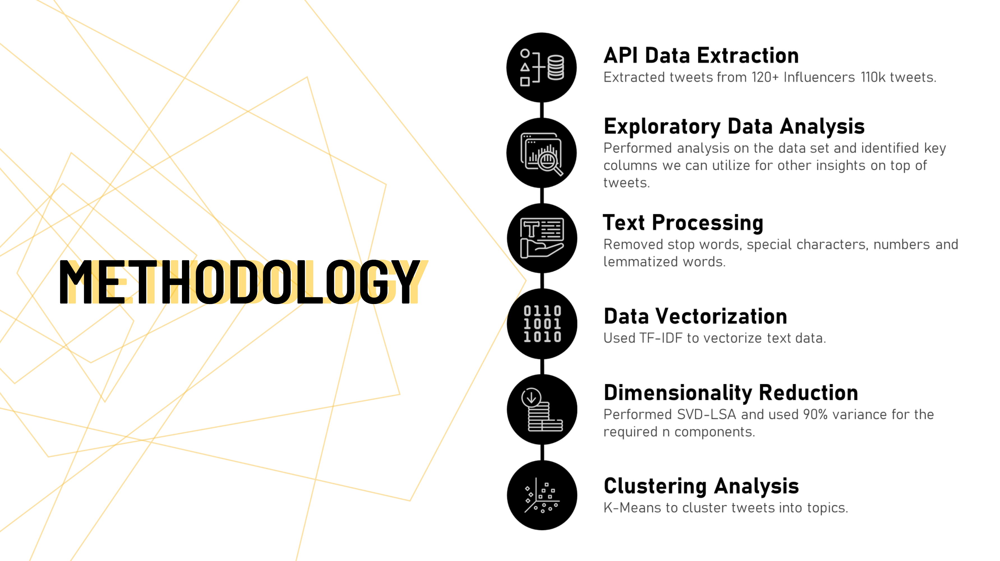

The team created a loader script for the extraction of tweets. Having an Academic Research Access on Twitter was needed to query historical tweets. Post extraction the JSON format tweets (39.9k records) are loaded into a SQL Database for easier retrieval in a single table, the team did not normalize the table further since all needed work with this table can already be performed given its current form. The extracted API data was then loaded as a table in SQLite3 database `twitter.db`. The table `twitter_dump` contains the 17 columns from the API data, all in text format except the `possibly_sensitive` column which is numerical. Although there are multi level JSON entries like the `entities` and `public_metrics` columns, they were left as is because they were not used for the analysis.

Exploratory Data Analysis (EDA) was done to understand the data better. Part of the EDA allowed the team to identify keywords needed to be removed through text processing. In the text processing, NLTK was used to remove identified stop words, special characters, and to lemmatize tokens and reduce them to their base form.

Post-text-processing, different iterations of the TF-IDF using the min_df and max_df combination was done to see what makes the most sense from the clusters. The team had consensus in using 5 (`min_df`) and .8 (`max_df`). To be able to reduce the dimensions, SVD-LSA was performed on both bull and bear data sets. Bull market data set with 24.7k records and 4k+ components we have reduced to only using 2.2k which is around 47% reduction at 90% cumulative variance. Similarly for the Bear market data set which has 15.2k records and 3.5k components we have reduced it to 1.8k which is around 47% reduction at 90% cumulative variance.

The next step is to start clustering the data set with reduced dimensions and identify the optimal number of clusters using K-Means Clustering using either its inertia (sum of squared errors) or silhouette score graphs. Unfortunately, no ideal number of clusters was found. Even at 30+ clusters, the graph just maintains a downtrend. The team agreed that keeping the cluster number to most 10 for this project will be ideal, so interpretability can be touched upon. 

The last step was to interpret the data and we used PCA (PC1-2) and t-SNE (50 components) to visualize the data set. The graph from t-SNE is more interpretable versus PCA due to the number of data points accounted for (will be shown in the charts later). The team also tried applying other topic modeling techniques like LDA and Hierarchal Clustering. However, due to time and resource constraints, only K-Means Clustering results were interpreted.

## Exploratory Data Analysis

In [5]:
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd

from matplotlib import pyplot as plt
import matplotlib.cm as cm
from wordcloud import WordCloud, STOPWORDS
from PIL import Image
import seaborn as sns

import sqlite3
from tqdm import tqdm, trange
from collections import Counter
from time import time

import re
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import TruncatedSVD
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE

from sklearn.pipeline import Pipeline
from sklearn.metrics import silhouette_score

In [6]:
Connecting to a db in a masked file path
with open('filepath.txt') as f:
    filepath = f.readline().split('"')[1]

conn = sqlite3.connect(f'{filepath}/final-lab/twitter_new.db')


In [7]:
# Preparing data for EDA charts
df = pd.read_sql_query("SELECT * FROM twitter_dump", conn)
df_stats = df['public_metrics'].apply(eval).apply(pd.Series)
df = df.join(df_stats)

df_bull = df[df['created_at']<'2022-01-01'].copy()
df_bear = df[df['created_at']>='2022-01-01'].copy()

df_bull['created_at'] = pd.to_datetime(df_bull['created_at'])
df_bear['created_at'] = pd.to_datetime(df_bear['created_at'])

df_bull['counter'] = 1
df_bear['counter'] = 1

### Weekly volume of tweets during the bull & bear seasons

Comparing the graphs on the weekly volume of tweets during a bull vs bear market, it is evident that Crypto Influencers/Traders tweeted more during the bull market as compared to during the bear market. 

The volume of tweets during a bull market exceeds 2,500 tweets per week on almost all weeks. On the other hand, during the bear market, the volume of tweets were mostly below 2,500 except for the week of Nov 13. Examining Bitcoin price history online, it was at this week that the price of Bitcoin dropped to its lowest year-to-date price.

Analyzing the volume of tweets on the above graphs and the Bitcoin price during these periods, sentiments or tweets posted by influencers influenced other investors’ trading activities and in predicting returns. 

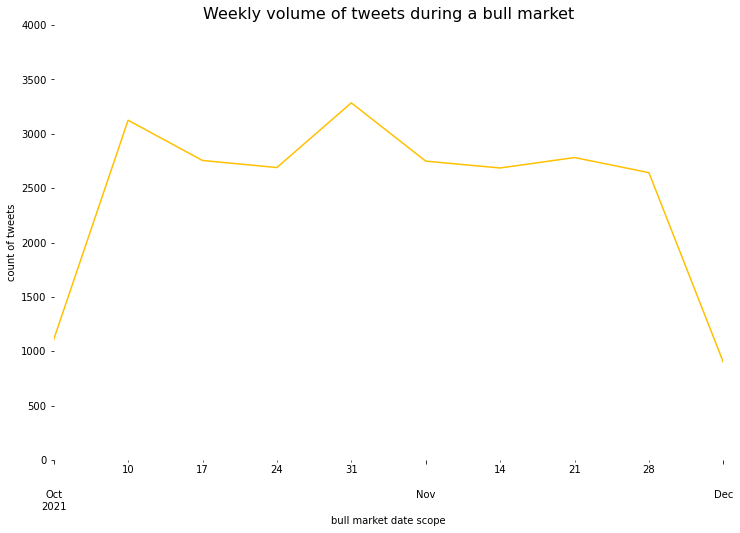

In [13]:
# Plotting time series line plot for weekly tweet count, bull market
bull_ts = df_bull.set_index('created_at')['counter'].resample('W').sum()

fig, ax = plt.subplots(figsize=(12,8))

ax.spines["top"].set_visible(False)    
ax.spines["bottom"].set_visible(False)    
ax.spines["right"].set_visible(False)    
ax.spines["left"].set_visible(False)    

bull_ts.plot(color='#ffc000')

plt.title('Weekly volume of tweets during a bull market', fontsize=16)
plt.ylabel('count of tweets')
plt.xlabel('bull market date scope')
plt.ylim(0, 4000)

plt.show()

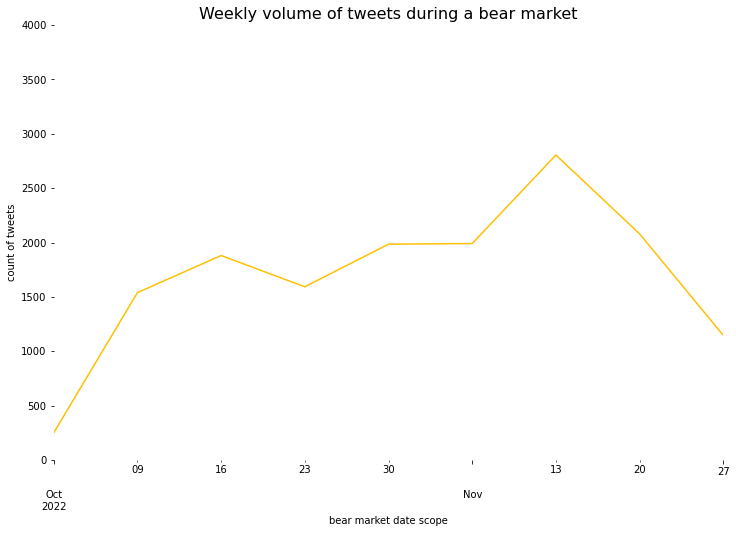

In [12]:
# Plotting time series line plot for weekly tweet count, bear market
bear_ts = df_bear.set_index('created_at')['counter'].resample('W').sum()

fig, ax = plt.subplots(figsize=(12,8))

ax.spines["top"].set_visible(False)    
ax.spines["bottom"].set_visible(False)    
ax.spines["right"].set_visible(False)    
ax.spines["left"].set_visible(False)    

bear_ts.plot(color='#ffc000')

plt.title('Weekly volume of tweets during a bear market', fontsize=16)
plt.ylabel('count of tweets')
plt.xlabel('bear market date scope')

plt.ylim(0, 4000)
plt.show()

### Top influencers during bear & bull seasons

The Top 4 on the list of influencers based on the number of posts during the bull and bear markets were consistent. Nebraskangooner, IncomeSharks, crypto_birb and MacroCRG topped the list regardless of where the market is heading. The changes in the number of posts were only evident with other influencers like TechDev_52 whose tweets dropped significantly from bull to bear and VentureCoinist whose tweets increased from bull to bear.

TechDev_52 seldom post original tweets on cryptocurrency but often times retweets other influencer’s post. Though CryptoMichNL and stablewon were average in terms of posting original tweets, they both belong to the Top 3 influencers who retweets other influencers posts.

With regards to the number of replies made on tweets, only CryptoMichNL was the influencer who was consistent replying on tweets regardless of the market situtaiton. Other influencers shifted from replying to not replying tweets from bull to bear, and vice versa. Among those influencers who were responsive during bull market but not during the bear market were scottmelker, TheCryptoDog, and crpto_birb. The influencers who were average on posting replies during the bull market but became active during bear were TechDev_52, stablewon, and rektcapital.

What we can decipher from these 6 graphs is that Top influencers like Nebraskagooner, IncomeSharks, MacroCRG, with the exception of crypto_birb, only post tweets but seldom retweet or replies tweets of others users. Also, those who seldom post original tweets like TechDev_52,  CryptoMichNL and stablewon were the ones actively retweeting and replies on tweets and still managed to be considered as one of the top influencers on cryptocurrency worldwide.

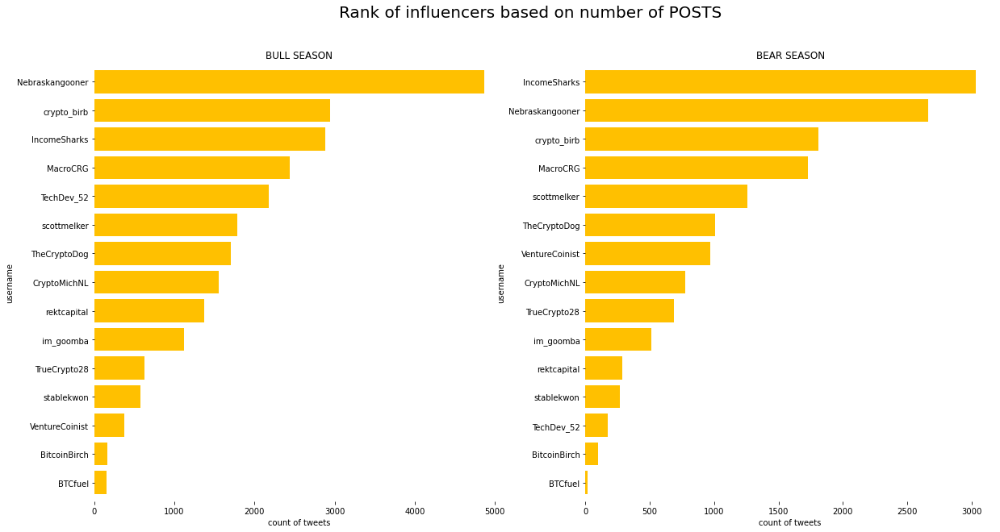

In [11]:
# Plotting bar charts to compare influencer performance, POST COUNT
bull_inf_posts = df_bull.groupby('username').size().nsmallest(15)
bear_inf_posts = df_bear.groupby('username').size().nsmallest(15)

fig, axs = plt.subplots(1, 2, figsize=(20,10))

for ax in axs:
    ax.spines["top"].set_visible(False)    
    ax.spines["bottom"].set_visible(False)    
    ax.spines["right"].set_visible(False)    
    ax.spines["left"].set_visible(False)    

bull_inf_posts.plot.barh(color='#ffc000', width=0.8, ax=axs[0])
bear_inf_posts.plot.barh(color='#ffc000', width=0.8, ax=axs[1])

plt.suptitle('Rank of influencers based on number of POSTS', fontsize=20)

axs[0].set_title('BULL SEASON')
axs[1].set_title('BEAR SEASON')

axs[0].set_xlabel('count of tweets')
axs[1].set_xlabel('count of tweets')

plt.show()

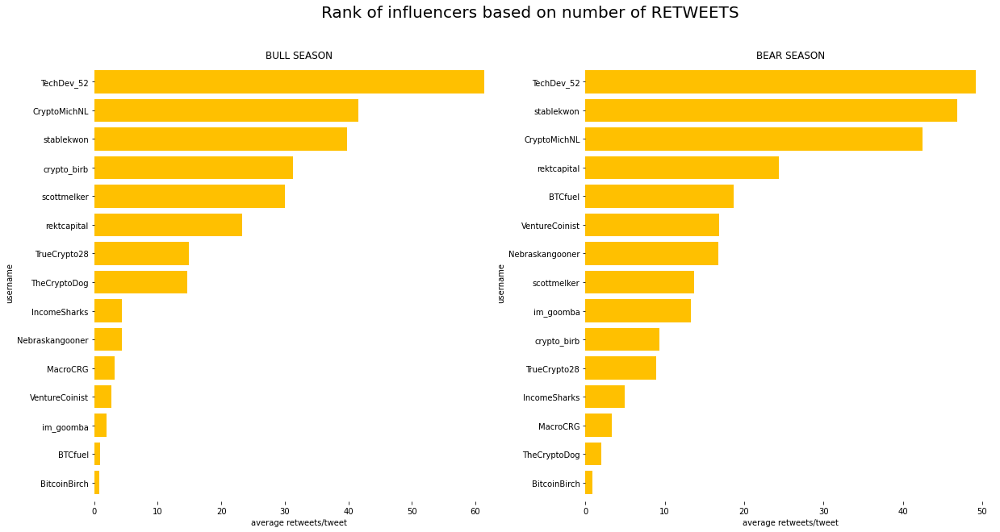

In [8]:
# Plotting bar charts to compare influencer performance, RETWEET COUNT
bull_inf_posts = df_bull.groupby('username')['retweet_count'].mean().nsmallest(15)
bear_inf_posts = df_bear.groupby('username')['retweet_count'].mean().nsmallest(15)

fig, axs = plt.subplots(1, 2, figsize=(20,10))

for ax in axs:
    ax.spines["top"].set_visible(False)    
    ax.spines["bottom"].set_visible(False)    
    ax.spines["right"].set_visible(False)    
    ax.spines["left"].set_visible(False)    

bull_inf_posts.plot.barh(color='#ffc000', width=0.8, ax=axs[0])
bear_inf_posts.plot.barh(color='#ffc000', width=0.8, ax=axs[1])

plt.suptitle('Rank of influencers based on number of RETWEETS', fontsize=20)

axs[0].set_title('BULL SEASON')
axs[1].set_title('BEAR SEASON')

axs[0].set_xlabel('average retweets/tweet')
axs[1].set_xlabel('average retweets/tweet')

plt.show()

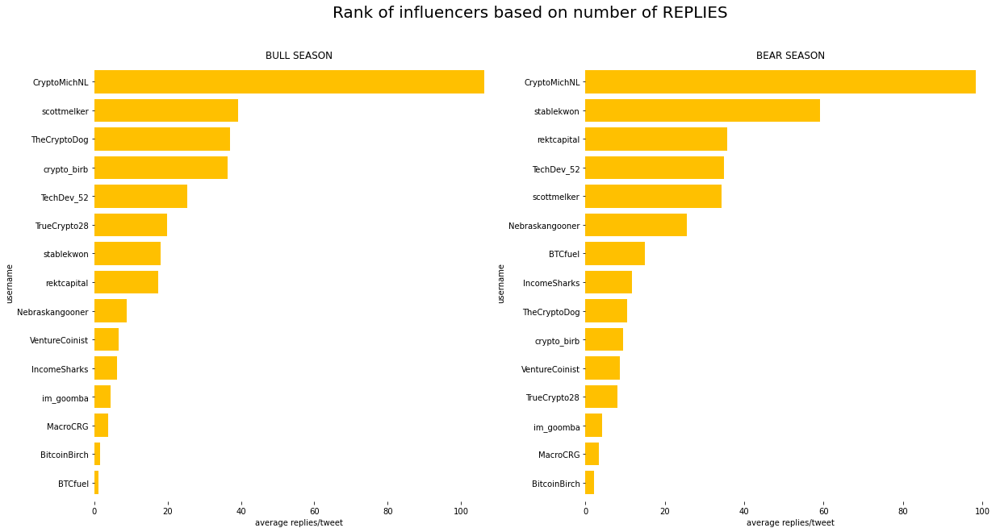

In [9]:
# Plotting bar charts to compare influencer performance, REPLY COUNT
bull_inf_posts = df_bull.groupby('username')['reply_count'].mean().nsmallest(15)
bear_inf_posts = df_bear.groupby('username')['reply_count'].mean().nsmallest(15)

fig, axs = plt.subplots(1, 2, figsize=(20,10))

for ax in axs:
    ax.spines["top"].set_visible(False)    
    ax.spines["bottom"].set_visible(False)    
    ax.spines["right"].set_visible(False)    
    ax.spines["left"].set_visible(False)    

bull_inf_posts.plot.barh(color='#ffc000', width=0.8, ax=axs[0])
bear_inf_posts.plot.barh(color='#ffc000', width=0.8, ax=axs[1])

plt.suptitle('Rank of influencers based on number of REPLIES', fontsize=20)

axs[0].set_title('BULL SEASON')
axs[1].set_title('BEAR SEASON')

axs[0].set_xlabel('average replies/tweet')
axs[1].set_xlabel('average replies/tweet')

plt.show()

### Comparing word frequencies of tweets during bear & bull seasons

BTC, Bitcoin, time, one, and now are the words common to both bull and bear markets. Word clouds, however, do not suffice in grasping context of tweets during different market seasons. This highlights the value of doing topic clustering which provides a more context about our data.

The word cloud below is a snapshot of the words contained in the tweet of top crypto traders in Twitter during bull market season.

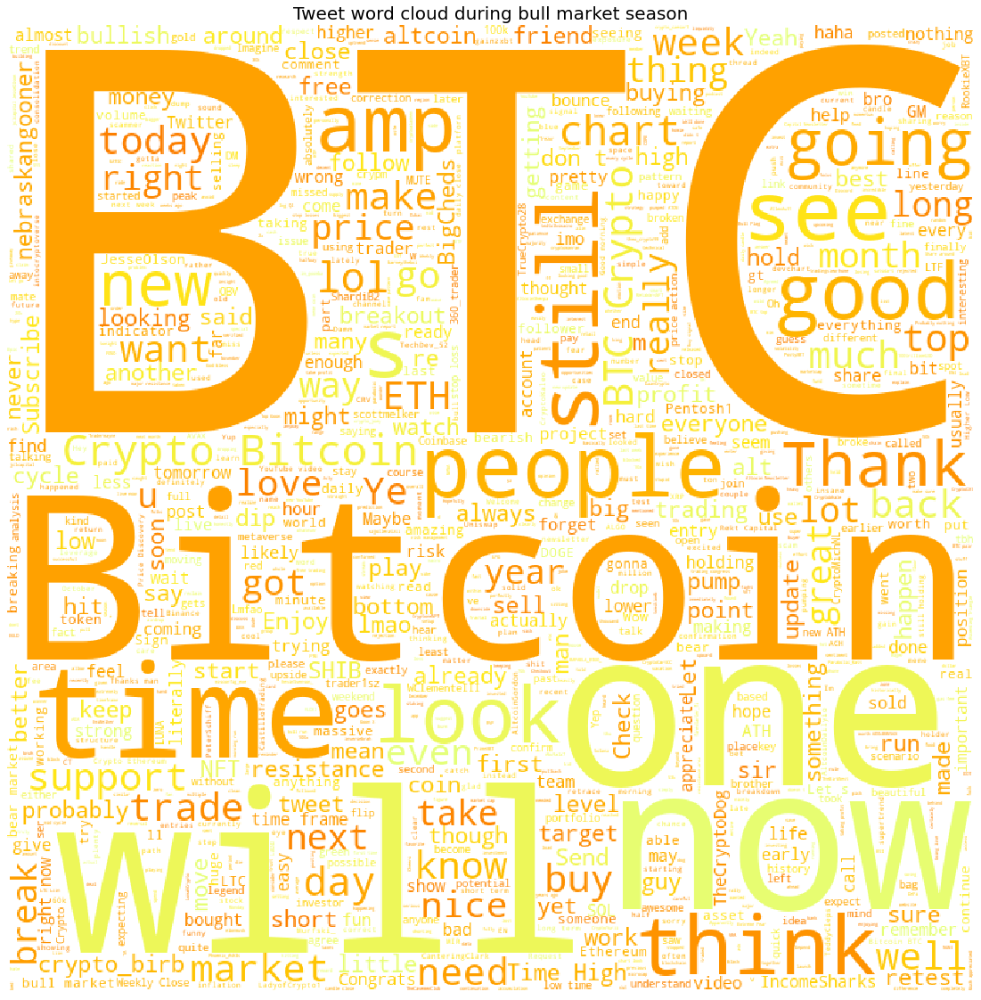

In [10]:
# Generating word cloud of tweets during the BULL SEASON
df_less = pd.read_sql_query("SELECT text FROM twitter_dump WHERE created_at < '2022-01-01'", conn)

data1 = df_less['text'].str.replace('https', '')
data1 = data1.to_frame()
data = data1['text'].str.replace('t.co', '')
data = data.to_frame()

text = ' '.join(data['text'].tolist())

wc = WordCloud(stopwords = STOPWORDS,
               background_color = "white",
               max_words = 1000, max_font_size = 500,
               random_state = 42, width = 800,
               height = 800, colormap='Wistia')

plt.figure(figsize=(20,20))
plt.tight_layout(pad=0)
wc.generate(text)
plt.imshow(wc, interpolation="None")
plt.axis('off')

plt.title('Tweet word cloud during bull market season', fontsize=20)

plt.savefig('bullwc.png', dpi=200)
plt.show()

This word cloud shows words contained in the tweet of top crypto traders in Twitter during bear market season.

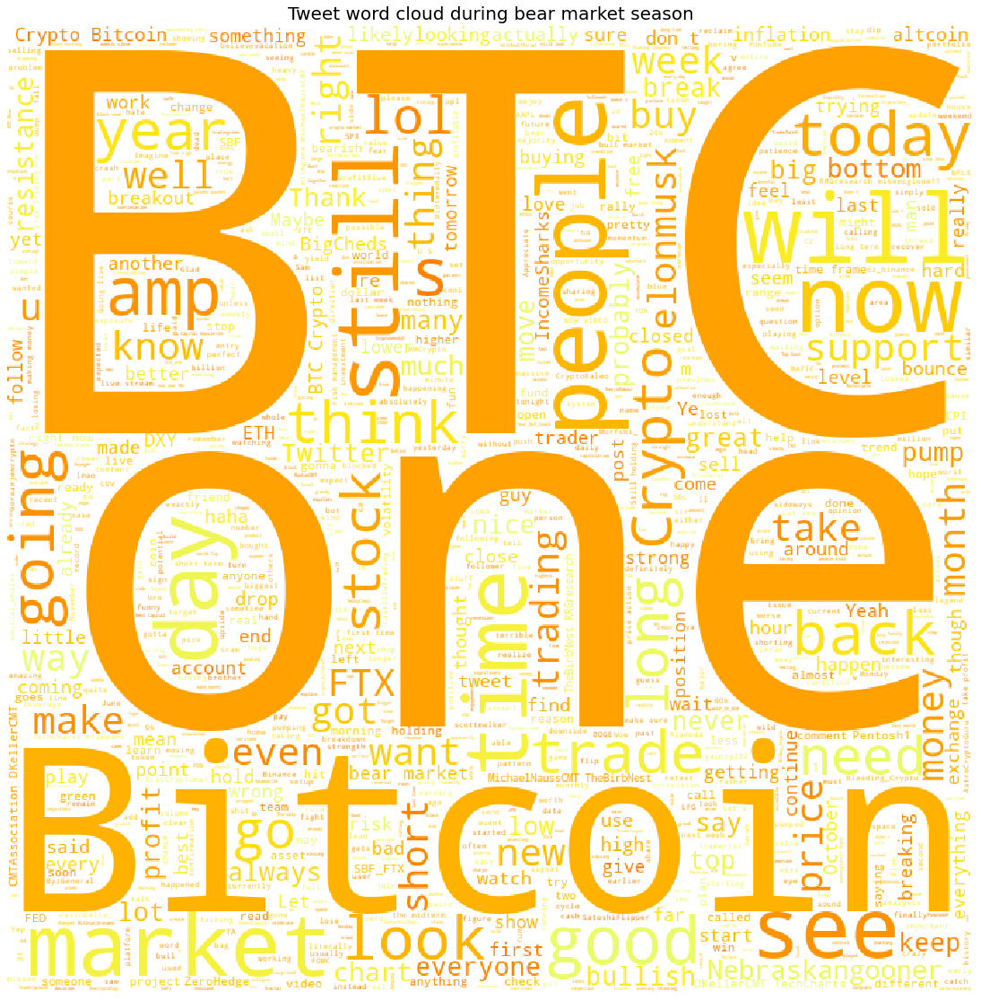

In [8]:
# Generating word cloud of tweets during the BEAR SEASON
df_greater = pd.read_sql_query("SELECT text FROM twitter_dump WHERE created_at > '2022-01-01'", conn)

data1 = df_greater['text'].str.replace('https', '')
data1 = data1.to_frame()
data = data1['text'].str.replace('t.co', '')
data = data.to_frame()

text = ' '.join(data['text'].tolist())

wc = WordCloud(stopwords = STOPWORDS,
               background_color = "white",
               max_words = 1000, max_font_size = 500,
               random_state = 42, width = 800,
               height = 800, colormap='Wistia')

fig = plt.figure(figsize=(15,15))

plt.tight_layout(pad=0)
wc.generate(text)
plt.imshow(wc, interpolation="None")
plt.axis('off')
plt.tight_layout(pad = 0)

plt.title('Tweet word cloud during bear market season', fontsize=20)

fig.savefig('bearwc.png', dpi=200)

plt.show()

## Dimensionality Reduction & Clustering Results

In [14]:
def rmv_emails_websites(string):
    """Function removes emails, websites and numbers"""
    new_str = re.sub(r"\S+@\S+", ' ', string)
    new_str = re.sub(r"\S+.co\S+", ' ', new_str)
    new_str = re.sub(r"\S+.ed\S+", ' ', new_str)
    new_str = re.sub(r"[0-9]+", ' ', new_str)
    new_str = re.sub(r"[^A-Za-z]", ' ', new_str)
    return new_str

def process_text(corpus):
    """Function removes stop words and lemmatizes each token"""
    import nltk
    from nltk.corpus import stopwords 
    from nltk.tokenize import word_tokenize
    from nltk.stem.porter import PorterStemmer 
    from nltk.stem import WordNetLemmatizer
    

    stemmer = WordNetLemmatizer()

    #nltk.download('punkt')
    #nltk.download('stopwords')
    #nltk.download('wordnet')

    #remove non letters and turn to lower case
    print('Removing non A-Z a-z')
    corp_processed =  corpus.apply(lambda x: rmv_emails_websites(x.lower()))
    corp_tokenized = corp_processed.apply(lambda x: word_tokenize(x))
    print('Removing stop words')
    for w in corp_tokenized:
        if w in stopwords.words('english'):
            corp_tokenized.remove(w)
    print('Applying autocorrect and stem word')
    for i in range(len(corp_tokenized)):
        corp_tokenized[i] = [stemmer.lemmatize((word)) for word in corp_tokenized[i]]
    print('Cleansing done')
    clean_corpus = corp_tokenized.apply(lambda x: " ".join(x))
    
    return clean_corpus

def dimensionality_reduction(tf_idf_text):
    """Function returns fitted LSA on a specified TF-IDF matrix"""
    components = tf_idf_text.shape[1] - 1
    
    lsa1 = TruncatedSVD(n_components=components)
    t0 = time()
    print(f"Start LS at {t0}")
    lsa_results1 = lsa1.fit_transform(tf_idf_text)
    explained_variance1 = lsa1.explained_variance_ratio_.sum()

    print(f"LSA done in {time() - t0:.3f} s")
    print(f"Cumulative explained variance: {explained_variance1 * 100:.1f}%")

    plt.plot(np.arange(components), lsa1.explained_variance_)
    plt.plot(np.arange(components), lsa1.explained_variance_.cumsum())
    plt.xlabel('n_components')
    plt.ylabel('explained variance')
    plt.legend(labels=['current', 'cumulative'])
    
    plt.axhline(0.9, ls='--', color='g')
    plt.show()
    
    return lsa1

def find_optimal_clusters(data, max_k):
    """Function finds the optimal number of clusters
    for K-Means clustering based on SSE and Silhouette Score"""
    iters = range(2, max_k+1)
    
    sse = []
    ssv = []
    for k in iters:
        print(f'Fitting clusters {k}')
        kmean = KMeans(n_clusters=k, n_init=10, max_iter=500, random_state=20).fit(data)
        err = kmean.inertia_
        cluster_labels = kmean.predict(data)
        silhouette_avg = silhouette_score(data, cluster_labels)

        sse.append(err)
        ssv.append(silhouette_avg)
        print(f'Fit {k} clusters, SSE: {err}, silhouette_score: {silhouette_avg}')

        
    f, (ax1, ax2) = plt.subplots(2, 1)
    ax1.plot(iters, sse, marker='o')
    ax1.set_xlabel('Cluster Centers')
    ax1.set_xticks(iters)
    ax1.set_xticklabels(iters)
    ax1.set_ylabel('SSE')
    ax1.set_title('SSE by Cluster Center Plot')

    ax2.plot(iters, ssv, marker='o')
    ax2.set_xlabel('Cluster Centers')
    ax2.set_xticks(iters)
    ax2.set_xticklabels(iters)
    ax2.set_ylabel('Silhoutte Average')
    ax2.set_title('Silhoutte Average by Cluster Center Plot')
    plt.tight_layout()
    
    return np.argmin(sse) + 2, np.argmax(ssv) + 2

def plot_tsne_pca(data, labels):
    """Plots clustered matrix using TSNE"""
    print(labels)
    size = len(labels)
    max_label = max(labels)
    max_items = np.random.choice(range(data.shape[0]), size=size, replace=False)
    print(f'Start PCA')
    pca = PCA(n_components=2).fit_transform(data[max_items,:])
    print(f'Start tSNE')
    tsne = TSNE(learning_rate='auto', init='pca').fit_transform(PCA(n_components=50).fit_transform(data[max_items,:]))
    print(f'Start plotting')
    idx = np.random.choice(range(pca.shape[0]), size=size, replace=False)
    label_subset = labels[max_items]
    orig_subset = label_subset
    label_subset = [cm.hsv(i/max_label) for i in label_subset[idx]]
    
    f, ax = plt.subplots(1, 2, figsize=(14, 6))
    
    ax[0].scatter(pca[idx, 0], pca[idx, 1], c=label_subset)
    ax[0].set_title('PCA Cluster Plot')
    ax[0].set_xlim(-1, 1)
    ax[0].set_ylim(-1, 1)
    
    ax[1].scatter(tsne[idx, 0], tsne[idx, 1], c=label_subset)
    ax[1].set_title('TSNE Cluster Plot')
    
    return orig_subset, label_subset, tsne
    
def get_top_keywords(data, clusters, labels, n_terms):
    """Returns top keywords of each cluster"""
    df = pd.DataFrame(data).groupby(clusters).mean()
    
    for i,r in df.iterrows():
        print('\nCluster {}'.format(i))
        print(','.join([labels[t] for t in np.argsort(r)[-n_terms:]]))
            
def vectorize_corpus(txt, feat=None):
    """Transforms a collection of text documents into a TF-IDF matrix"""
    from sklearn.feature_extraction import _stop_words

    stpwrds = _stop_words.ENGLISH_STOP_WORDS.union(['ha', 'wa', 'don', 'let', 've', 'll', 'didn', 'did'])
    
    print('Start vectorization')
    tfidf = TfidfVectorizer(
        max_features = feat,
        min_df = 5,
        max_df = .80,
        stop_words = stpwrds
    )
    tfidf.fit(txt)
    text = tfidf.transform(txt)
    nonzeros = text.sum(axis=1).nonzero()[0]
    text = text[nonzeros]
    print('End vectorization')
    return text, tfidf

### Reducing & clustering bull market tweets

Removing non A-Z a-z
Removing stop words
Applying autocorrect and stem word
Cleansing done
Start vectorization
End vectorization
Start LS at 1670314309.268119
LSA done in 105.804 s
Cumulative explained variance: 100.0%


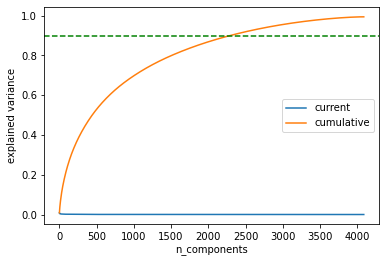

Bull Features Required at 90% Variance 2293


In [11]:
# Reducing dimensionality of the design matrix for tweets during BULL SEASON and showing variance explained
df = pd.read_sql_query("SELECT text FROM twitter_dump WHERE created_at < '2022-01-01'", conn)

txt = process_text(df.text)
text, tfidf = vectorize_corpus(txt)

lsa = dimensionality_reduction(text)
cs = lsa.explained_variance_.cumsum()
max_bull_features = np.transpose(np.nonzero(cs >= .9))[0][0]
print(f'Bull Features Required at 90% Variance {max_bull_features}')

Start LSA Bull truncated to 2293
Fitting clusters 2
Fit 2 clusters, SSE: 20766.468799307026, silhouette_score: 0.007426607581517032
Fitting clusters 3
Fit 3 clusters, SSE: 20696.74718731378, silhouette_score: 0.004298752958145063
Fitting clusters 4
Fit 4 clusters, SSE: 20609.50037769069, silhouette_score: 0.004829777068258613
Fitting clusters 5
Fit 5 clusters, SSE: 20561.580971915046, silhouette_score: 0.00738978888984316
Fitting clusters 6
Fit 6 clusters, SSE: 20489.74682145033, silhouette_score: 0.003921603926223518
Fitting clusters 7
Fit 7 clusters, SSE: 20434.8514679609, silhouette_score: 0.007112377179686237
Fitting clusters 8
Fit 8 clusters, SSE: 20346.522424175775, silhouette_score: 0.0063695817432118974
Fitting clusters 9
Fit 9 clusters, SSE: 20317.035961022775, silhouette_score: 0.010833172472145389
Fitting clusters 10
Fit 10 clusters, SSE: 20266.815065426315, silhouette_score: 0.009273543996728605
Fitting clusters 11
Fit 11 clusters, SSE: 20227.203344876325, silhouette_score:

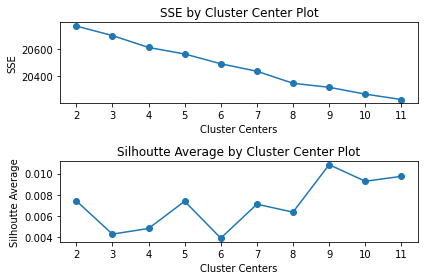

In [12]:
# Clustering based on reduced data matrix of tweets for BULL SEASON
max_bull_features = 2293

print(f"Start LSA Bull truncated to {max_bull_features}")
lsa = TruncatedSVD(n_components=max_bull_features)
text_ = lsa.fit_transform(text)

sse, cluster = find_optimal_clusters(text_, 11)

Start Clustering for 9
[3 6 3 ... 6 6 7]
Start PCA
Start tSNE
Start plotting


Cluster Distribution
Counter({6: 18744, 3: 1338, 4: 1317, 1: 537, 8: 471, 2: 399, 7: 289, 0: 123, 5: 84})


Cluster 0: ltc usd crypto blue resistance eth support area angel close btc weekly time breakout fantastic 
Cluster 1: day btc today free just good week like time trading chart going tomorrow amp eth 
Cluster 2: birb crypto joey caesar brother trader theo thanks cryptomichnl wclementeiii legend lol thank man respect 
Cluster 3: like look chart just good btc feel time really nice bullish think market ready great 
Cluster 4: btc crypto new time high close market resistance area support video month bull retest youtube 
Cluster 5: canteringclark rager shardib cryptotony nebraskangooner people time cryptosays anbessa koroushak real rafaela rigo rektcapital pentosh 
Cluster 6: just time good crypto going think people market thanks nice man love lmao new know 
Cluster 7: yes sir ahh jclcapital kevinsvenson jus

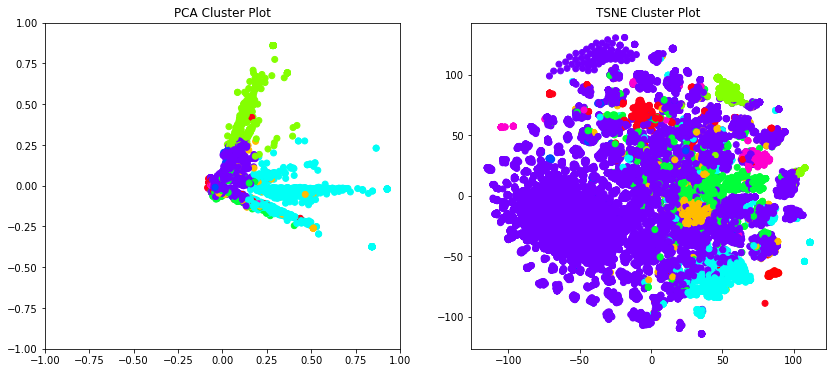

In [19]:
# Plotting TSNE and looking at the top terms for each cluster to grasp context of groupings
# We will keep the cluster at 9 to align the results from the initial run we due to it changes per run
cluster = 9
print(f'Start Clustering for {cluster}')
kmeans = KMeans(n_clusters=cluster, n_init=10, max_iter=500, random_state=20)
clusters = kmeans.fit_predict(text_)
label_bull, cm_bull, tsne_bull =  plot_tsne_pca(text_, clusters)

original_space_centroids = lsa.inverse_transform(kmeans.cluster_centers_)
order_centroids = original_space_centroids.argsort()[:, ::-1]
terms = tfidf.get_feature_names_out()

from collections import Counter
print('\n')
print(f'Cluster Distribution')
print(Counter(np.sort(clusters)))
print('\n')
for i in range(cluster):
    print(f"Cluster {i}: ", end="")
    for ind in order_centroids[i, :15]:
        print(f"{terms[ind]} ", end="")
    print()
    

The table below shows our interpretation of the different clusters formed during a bull season, and their corresponding sizes.
<br>
<br>
<center>Table 1. Themes of conversations for tweets during the bull season<center>

|<center>Theme</center>|<center>%</center>|
|:--|:--|
|Nice market| 82.1%|
|All time high resistance|5.9%|
|Influencer engagements|3.5%|
|Getting into the bull run|3.4%|
|Influencer trade POV|1.5%|
|Other positive sentiments|1.4%|
|Discourse, doubt|1.2%|
|Twitter-related discussions|0.7%|
|Market hype|0.3%|

### Reducing & clustering bear market tweets

Removing non A-Z a-z
Removing stop words
Applying autocorrect and stem word
Cleansing done
Start vectorization
End vectorization
Start LS at 1670314979.184453
LSA done in 47.408 s
Cumulative explained variance: 100.0%


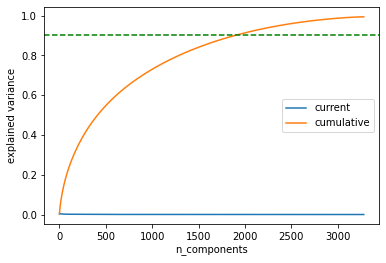

Bear Features Required at 90% Variance 1890


In [16]:
# Reducing dimensionality of the design matrix for tweets during BEAR SEASON and showing variance explained
df_new = pd.read_sql_query("SELECT text FROM twitter_dump WHERE created_at > '2022-01-01'", conn)

txt_new = process_text(df_new.text)
text_new, tfidf_new = vectorize_corpus(txt_new)
lsa_new = dimensionality_reduction(text_new)

cs_new = lsa_new.explained_variance_.cumsum()
max_bear_features = np.transpose(np.nonzero(cs_new >= .9))[0][0]
print(f'Bear Features Required at 90% Variance {max_bear_features}')

Start LSA Bear truncated to 1890
Fitting clusters 2
Fit 2 clusters, SSE: 12963.038531332186, silhouette_score: -0.0013071664341417681
Fitting clusters 3
Fit 3 clusters, SSE: 12886.00804721266, silhouette_score: 0.0025085217332370302
Fitting clusters 4
Fit 4 clusters, SSE: 12882.716340383868, silhouette_score: 0.0006389592028710491
Fitting clusters 5
Fit 5 clusters, SSE: 12811.95547483809, silhouette_score: 0.006845332612350633
Fitting clusters 6
Fit 6 clusters, SSE: 12791.962077360035, silhouette_score: 0.003552368170501016
Fitting clusters 7
Fit 7 clusters, SSE: 12706.634401050826, silhouette_score: 0.008053283723791764
Fitting clusters 8
Fit 8 clusters, SSE: 12683.459614580966, silhouette_score: 0.009869228978457144
Fitting clusters 9
Fit 9 clusters, SSE: 12675.447847431897, silhouette_score: 0.005951586336414796
Fitting clusters 10
Fit 10 clusters, SSE: 12586.406258044186, silhouette_score: 0.012590767411389002
Fitting clusters 11
Fit 11 clusters, SSE: 12607.681079795575, silhouette

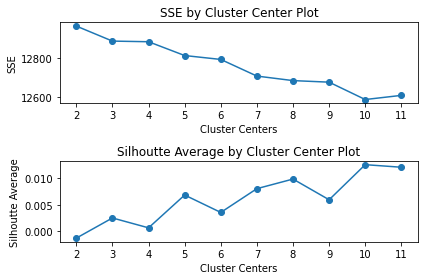

In [17]:
# Clustering based on reduced data matrix of tweets for BEAR SEASON
max_bear_features = 1890
print(f"Start LSA Bear truncated to {max_bear_features}")
lsa_new = TruncatedSVD(n_components=max_bear_features)

text_new_ = lsa_new.fit_transform(text_new)

sse_new , cluster_new = find_optimal_clusters(text_new_, 11)

Start Clustering for 10
[9 5 9 ... 6 6 6]
Start PCA
Start tSNE
Start plotting


Cluster Distribution
Counter({6: 10747, 5: 732, 8: 692, 7: 644, 9: 412, 1: 352, 0: 289, 4: 273, 2: 269, 3: 93})


Cluster 0: profit lue short closed trade stock just took today way taking like stop long loss 
Cluster 1: new video watch youtube high low today market just make amp week update day live 
Cluster 2: elonmusk twitter lmao bot tweet doge aoc verified billym people check yes elon know fix 
Cluster 3: rrgresearch cmtassociation dkellercmt mtimpane techcharts michaelnausscmt mikemcglone thebirbnest thanks thx dzi ki cheer crypto thank 
Cluster 4: nebraskangooner cryptoforall lol haha just yeah stock money people like time going look bearish good 
Cluster 5: like look just feel people time looking market stock trade day year chart sound support 
Cluster 6: time just people market day lol ftx trader going year think today nice got right 
Cluster 7: crypto timeless bitlord market bitboy birb stock head 

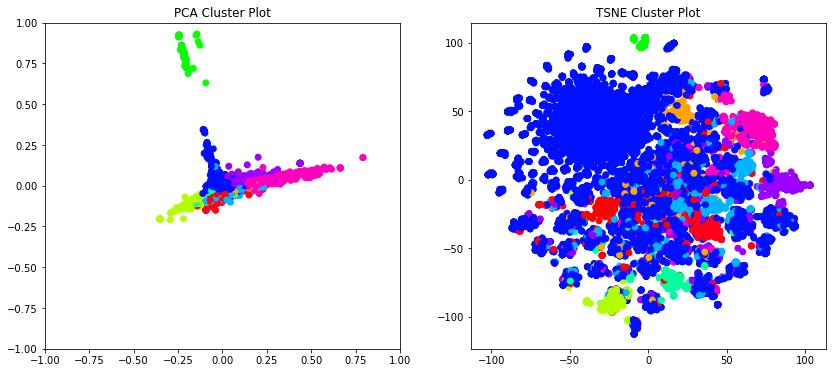

In [20]:
# Plotting TSNE and looking at the top terms for each cluster to grasp context of groupings
cluster_new = 10
print(f'Start Clustering for {cluster_new}')
kmeans_new = KMeans(n_clusters=cluster_new, n_init=10, max_iter=500, random_state=20)
clusters_new = kmeans_new.fit_predict(text_new_)
label_bear, cm_bear, tsne_bear = plot_tsne_pca(text_new_, clusters_new)

original_space_centroids = lsa_new.inverse_transform(kmeans_new.cluster_centers_)
order_centroids = original_space_centroids.argsort()[:, ::-1]
terms = tfidf_new.get_feature_names_out()

from collections import Counter
print('\n')
print(f'Cluster Distribution')
print(Counter(np.sort(clusters_new)))
print('\n')

for i in range(cluster_new):
    print(f"Cluster {i}: ", end="")
    for ind in order_centroids[i, :15]:
        print(f"{terms[ind]} ", end="")
    print()

The table below shows our interpretation of the different clusters formed from teets during a bear season, and their corresponding sizes.
<br>
<br>
<center>Table 2. Themes of conversations for tweets during the bear season<center>

|<center>Theme</center>|<center>%</center>|
|:--|:--|
|Influencer discussions|77.5%|
|Negative sentiments|5.4%|
|Technical analysis|4.6%|
|Encouraging people to trade|3.8%|
|Influencer trade POV|2.9%|
|Twitter-related discussions|2.0%|
|Profit from crypto|1.9%|
|Timeless crypto|0.8%|
|Hopeful sentiments|0.7%|    
|Trading analysis|0.5%|

## Conclusion

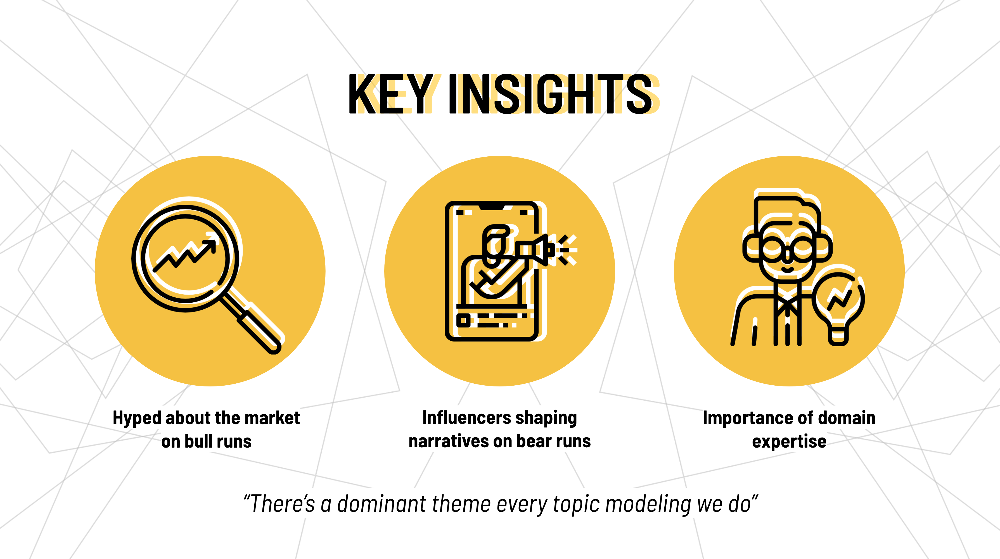

There’s a dominant theme in every clustering where 70-80% of tweets get grouped into one cluster. This is logical! Given a group of people with the same interests tweeting about the same niche, there should be a consensus between them. We can make this a hypothesis and potentially try out a different set of influencers from another niche. We have identified that the random state of the clustering may change the results every run even if we had set a random state in the k-means however the topics are still the same but the % of clusters moved this shows high correlation between the tweets.

Given the number of tweets we’ve processed, there is a lot more clusters that can be formed given how we tried doing a 30+ iteration in K-Means. The variance decreases as more clusters are created. Though even if we have all these clusters, majority of the tweets may still reside in one cluster. For the purpose of this exercise, 9-10 clusters may be enough to show general themes of conversations from the topic modeling of tweets. 

The decision to replace the influencers data used in the study was pivotal since the first set of influencers tweets about broader and more varied topics. This resulted to topics formed that also did not make much sense. When we used a more technical group of influencers focused on actual crypto trading and market analysis, the interpretability improved by a lot.

The narrative for each cluster we have for the 2 cycles is based on our knowledge. This is very subjective, and we believe another set opinion will surely arise if other domain experts review it.


Visualization in t-SNE is highly interpretable versus PCA, however, the former is computationally expensive. 
Results will vary a lot when changing the stop words used, lemmatizing words, cleansing the data, and the biggest impact is how well we’ve tuned the document frequency for TF-IDF. A sheer amount of testing is needed for NLP-based projects to yield the ideal results.

Overall, the exercise is computationally expensive and each cycle takes 3-4 hours to prepare, process, cluster, and interpret data using our methodology. An effective approach would be to understand all the available techniques, identify a couple of models we can use then run each with a baseline and select the best that fits the requirement.

## Recommendations

The following are potential next steps for our project.

1. Since we already have a baseline using LSA-SVD/K-means based on the findings, we can try out other Topic Modeling and Text Clustering techniques to see if there would be a difference in the groupings and how interpretable would it be. It would be interesting to see if we can still get the same 70-80% grouping or if it may change since each algorithm groups it differently.

2. Temporal Analysis on multiple periods of the bear and bull market can be performed. Ideally, we wanted to do more than 1 cycle but Twitter Crypto only blew up last year. We can wait for another cycle of a Bull and Bear market, so we can make follow-up studies about it.

4. Performing N-Grams in TF-IDF may yield a different set of results and can also be explored.

5. We can build a Crypto Influencer Recommender System on top of this as we can do information retrieval on the Clustered Data Set. Based on the keywords entered, it can return the Top list of crypto influencers that are relevant to this topic. 

## References

[[1] Statista. (2022, December 5). Bitcoin BTC/USD price history up until Dec 04, 2022. https://www.statista.com/statistics/326707/bitcoin-price-index/](https://www.statista.com/statistics/326707/bitcoin-price-index/)

[[2] Blockchain Facts: What Is It, How It Works, and How It Can Be Used. (2022, September 27). Investopedia. https://www.investopedia.com/terms/b/blockchain.asp](https://www.investopedia.com/terms/b/blockchain.asp)

[[3] The Basics about Cryptocurrency | CTS. (n.d.). https://www.oswego.edu/cts/basics-about-cryptocurrency](https://www.oswego.edu/cts/basics-about-cryptocurrency#:~:text=What%20is%20cryptocurrency%3F,as%20a%20virtual%20accounting%20system)

[[4] Duggan, W. (2022). The History of Bitcoin, the First Cryptocurrency. https://money.usnews.com/investing/articles/the-history-of-bitcoin](https://money.usnews.com/investing/articles/the-history-of-bitcoin)